# Vehicle Detection

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.

---
### Import Libraries

In [1]:
import numpy as np
import glob
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import os

from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import normalize
from sklearn.svm import LinearSVC
from scipy.ndimage.measurements import label
from moviepy.editor import VideoFileClip
%matplotlib inline

### Training Data Preparation

In [2]:
#File Read
cars = glob.glob('C:/CarND/vehicles/**/*.png')
nocars = glob.glob('C:/CarND/non-vehicles/**/*.png')

print("Number of car images: ",len(cars))
print("Number of non-car images: ",len(nocars))

images = []
for fname in cars:
    images.append(cv2.cvtColor(cv2.imread(fname),cv2.COLOR_BGR2RGB))

for fname in nocars:
    images.append(cv2.cvtColor(cv2.imread(fname),cv2.COLOR_BGR2RGB))
    
print("Total number of images: ",len(images))

#labels assigned
labels = np.concatenate([np.ones(len(cars)),np.zeros(len(nocars))])

#Random shuffle
X_data, y_data = shuffle(images, labels)


Number of car images:  8792
Number of non-car images:  8968
Total number of images:  17760


1.0


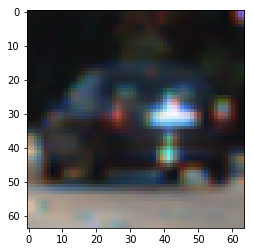

In [3]:
#Example car image
i = np.random.randint(1,len(cars),dtype='int')
plt.imshow(images[i])
print(labels[i])

0.0


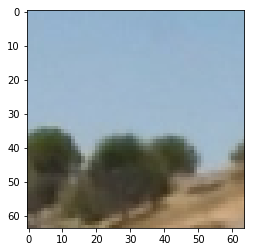

In [4]:
#Example non-car image
i = np.random.randint(len(cars),len(nocars),dtype='int')
plt.imshow(images[i])
print(labels[i])

In [5]:
del images
del labels

## Step 1: Histogram of Oriented Gradients (HOG) Feature Extraction

### Helper Functions

In [6]:
# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

In [7]:
# Define a function to compute color histogram features  
def color_hist(img, nbins=32, bins_range=(0, 256), cspace='RGB'):
    if cspace=='gray':
        hist_features = np.histogram(img[:,:], bins=nbins, range=bins_range)
    else:
        # Compute the histogram of the color channels separately
        channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
        channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
        channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
        # Concatenate the histograms into a single feature vector
        hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

In [8]:
#Explore transform_sqrt later

def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=False):
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                                  visualise=True, feature_vector=False)
        return features, hog_image
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False, 
                       visualise=False, feature_vector=feature_vec)
        return features

### Hog Example

In [9]:
colorspace = 'LUV'
pix_per_cell = 8
cell_per_block = 2
orient = 9
hog_channel = 0

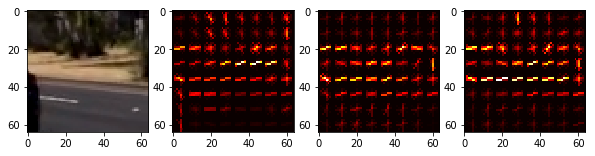

In [10]:
i = np.random.randint(1,len(X_data),dtype='int')
test_image = X_data[i]
test_image_conv = cv2.cvtColor(test_image, cv2.COLOR_RGB2LUV)
feature =[]
plt.subplots(1,4,figsize=(10,10))
plt.subplot(1,4,1)
plt.imshow(test_image)

for channel in range(test_image_conv.shape[2]):
    curr_feat, hog_image = get_hog_features(test_image_conv[:,:,channel], orient, pix_per_cell, cell_per_block, vis=True, feature_vec=False)
    feature.append(curr_feat)
    plt.subplot(1,4,channel+2)
    plt.imshow(hog_image, cmap = 'hot')

In [11]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, cspace='RGB', orient=9, pix_per_cell=8, cell_per_block=2, hog_channel=0, hist = True, spat = True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for image in imgs:
        # apply color conversion if other than 'RGB'
        curr_features = []
        if cspace != 'RGB':
            if cspace == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif cspace == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif cspace == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif cspace == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif cspace == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True).ravel())       
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True).ravel()
        
        curr_features.append(np.ravel(hog_features))
        
        if spat == True:
            spat_size = (32,32)
            spat_features = bin_spatial(feature_image, size=spat_size)
            curr_features.append(spat_features)
        
        if hist == True:
            hist_bins = 32
            hist_range = (0,256)
            hist_features = color_hist(feature_image, nbins=hist_bins, bins_range=hist_range, cspace=cspace)
            curr_features.append(hist_features)

        # Append the new feature vector to the features list
        features.append(np.concatenate(curr_features))
    
    # Return list of feature vectors
    return features

### Hog of dataset

In [12]:
features = extract_features(X_data, cspace=colorspace, orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, hist = True, spat = True)

print(len(features))      

17760


### Normalization

(17760, 4932)


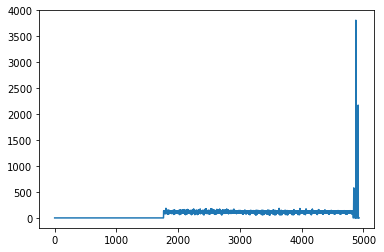

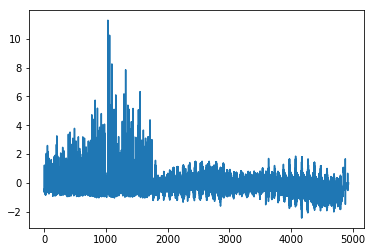

In [13]:
X = np.array(features).astype(np.float64)
print(X.shape)
plt.plot(X[5001])
feature_scaler = StandardScaler().fit(X)
features_scaled = feature_scaler.transform(X)
plt.figure()
plt.plot(features_scaled[5001])

## Step 2: Classifier Training

### Train-Test Split

In [14]:
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(features_scaled, y_data, test_size=0.2, random_state=rand_state)

print("Number of training images: ", len(X_train))
print("Number of testing images: ", len(X_test))

Number of training images:  14208
Number of testing images:  3552


In [15]:
# Use a linear SVC 
svc = LinearSVC()
svc.fit(X_train, y_train)

LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0)

In [16]:
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

Test Accuracy of SVC =  0.9831


In [17]:
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])

My SVC predicts:  [ 1.  0.  1.  0.  1.  0.  1.  0.  0.  1.]
For these 10 labels:  [ 1.  0.  1.  0.  1.  0.  1.  0.  0.  1.]


## Step 3: Sliding Window Technique

### Helper Functions

### Test image read

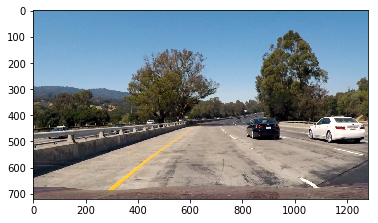

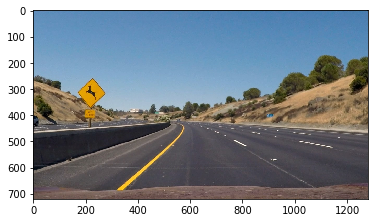

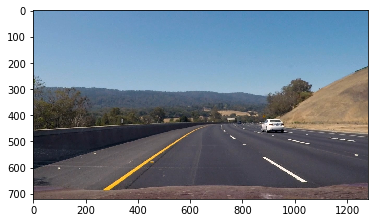

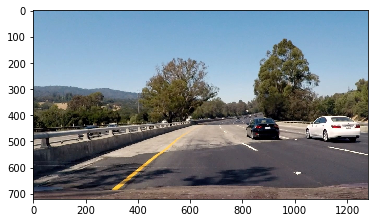

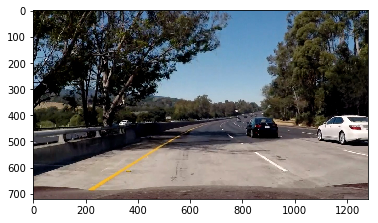

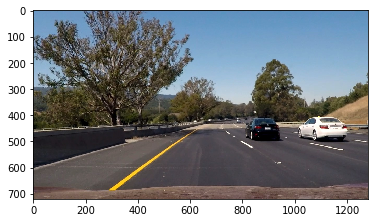

In [18]:
test_image_names = glob.glob('./test_images/test*.jpg')

test_images = []

#read images from filenames and convert to RGB from BGR
for fname in test_image_names:
    test_images.append(cv2.cvtColor(cv2.imread(fname),cv2.COLOR_BGR2RGB))
    
for im in test_images:
    fig=plt.figure()
    plt.imshow(im)

### Implementation

In [19]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    if conv == 'RGB2HSV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    if conv == 'RGB2HLS':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    if conv == 'RGB2YUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    else:
        return np.copy(img)

In [20]:
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

In [21]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
    # Return updated heatmap
    return heatmap

In [22]:
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

In [39]:
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, hog_channels ='ALL', hist = False, spat = False):
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)
    boxes=[]
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2LUV')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    if hog_channels == 0:
        hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    elif hog_channels == 1:
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    elif hog_channels == 2:
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    else:
        hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            curr_features=[]
            # Extract HOG for this patch
            hog_features=[]
            if hog_channels == 0:
                hog_features.append(hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel())
            elif hog_channels == 1:
                hog_features.append(hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel())
            elif hog_channels == 2:
                hog_features.append(hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel())
            else:
                hog_features.append(hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel())
                hog_features.append(hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel())
                hog_features.append(hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel())
            
            curr_features.append(np.ravel(hog_features))
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            if spat == True:
                # Get color features
                spat_size = (32,32)
                spatial_features = bin_spatial(subimg, size=spat_size)
                curr_features.append(spatial_features)
            
            if hist == True:
                hist_bins = 32
                hist_features = color_hist(subimg, nbins=hist_bins)
                curr_features.append(hist_features)
                test_feat = np.array(np.concatenate(curr_features)).astype(np.float64)
            # Scale features and make a prediction
            test_features = X_scaler.transform(test_feat)
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
    plt.figure()
    plt.plot(test_features)
    return draw_img, boxes

In [ ]:
ystart = 400
ystop = 656
scale = 1
boxes_set = []
for img in test_images:
    out_img, boxes = find_cars(img, ystart, ystop, scale, svc, feature_scaler, orient, pix_per_cell, cell_per_block, 
                               hog_channels = 0, hist = True, spat = True)
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    heatmap = add_heat(heat,boxes)
    heatmap = np.clip(heatmap, 0, 255)
    heatmap = apply_threshold(heatmap, 3)
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    plt.figure()
    plt.imshow(out_img)
    plt.figure()
    plt.imshow(heatmap, cmap='hot')
    plt.figure()
    plt.imshow(draw_img)

In [36]:
class Boxes():
    def __init__(self):
        # store recent boxes
        self.recent_boxes = []

In [37]:
def video_find_cars(img):
    out_img, boxes = find_cars(img, ystart, ystop, scale, svc, feature_scaler, orient, pix_per_cell, cell_per_block, 
                               hog_channels = 0, hist = True, spat = True)
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    if len(B.recent_boxes) > 10:
        B.recent_boxes.pop(0)
    B.recent_boxes.append(boxes)
    for b in B.recent_boxes:
        heat = add_heat(heat,b)
    heatmap = np.clip(heat, 0, 255)
    heatmap = apply_threshold(heatmap, 20)
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

In [38]:
output = 'test_video_output.mp4'
clip1 = VideoFileClip("test_video.mp4")
B=Boxes()

road_clip = clip1.fl_image(video_find_cars) #NOTE: this function expects color images!!
%time road_clip.write_videofile(output, audio=False)

(4932,)
[MoviePy] >>>> Building video test_video_output.mp4
[MoviePy] Writing video test_video_output.mp4


  0%|                                                   | 0/39 [00:00<?, ?it/s]

(4932,)


  3%|█                                          | 1/39 [00:00<00:26,  1.41it/s]

(4932,)


  5%|██▏                                        | 2/39 [00:01<00:26,  1.40it/s]

(4932,)


  8%|███▎                                       | 3/39 [00:02<00:25,  1.40it/s]

(4932,)


 10%|████▍                                      | 4/39 [00:02<00:25,  1.39it/s]

(4932,)


 13%|█████▌                                     | 5/39 [00:03<00:24,  1.40it/s]

(4932,)


 15%|██████▌                                    | 6/39 [00:04<00:23,  1.39it/s]

(4932,)


 18%|███████▋                                   | 7/39 [00:05<00:22,  1.40it/s]

(4932,)


 21%|████████▊                                  | 8/39 [00:05<00:22,  1.39it/s]

(4932,)


 23%|█████████▉                                 | 9/39 [00:06<00:22,  1.35it/s]

(4932,)


 26%|██████████▊                               | 10/39 [00:07<00:22,  1.31it/s]

(4932,)


 28%|███████████▊                              | 11/39 [00:08<00:21,  1.29it/s]

(4932,)


 31%|████████████▉                             | 12/39 [00:08<00:20,  1.30it/s]

(4932,)


 33%|██████████████                            | 13/39 [00:09<00:20,  1.29it/s]

(4932,)


 36%|███████████████                           | 14/39 [00:10<00:19,  1.29it/s]

(4932,)


 38%|████████████████▏                         | 15/39 [00:11<00:18,  1.32it/s]

(4932,)


 41%|█████████████████▏                        | 16/39 [00:11<00:17,  1.32it/s]

(4932,)


 44%|██████████████████▎                       | 17/39 [00:12<00:16,  1.34it/s]

(4932,)


 46%|███████████████████▍                      | 18/39 [00:13<00:15,  1.34it/s]

(4932,)


 49%|████████████████████▍                     | 19/39 [00:14<00:14,  1.34it/s]

(4932,)


 51%|█████████████████████▌                    | 20/39 [00:14<00:14,  1.34it/s]

(4932,)


 54%|██████████████████████▌                   | 21/39 [00:15<00:13,  1.34it/s]

(4932,)


 56%|███████████████████████▋                  | 22/39 [00:16<00:13,  1.24it/s]

(4932,)


 59%|████████████████████████▊                 | 23/39 [00:17<00:13,  1.20it/s]

(4932,)


 62%|█████████████████████████▊                | 24/39 [00:18<00:12,  1.17it/s]

(4932,)


 64%|██████████████████████████▉               | 25/39 [00:19<00:11,  1.19it/s]

(4932,)


 67%|████████████████████████████              | 26/39 [00:19<00:10,  1.23it/s]

(4932,)


 69%|█████████████████████████████             | 27/39 [00:20<00:09,  1.25it/s]

(4932,)


 72%|██████████████████████████████▏           | 28/39 [00:21<00:08,  1.28it/s]

(4932,)


 74%|███████████████████████████████▏          | 29/39 [00:22<00:07,  1.28it/s]

(4932,)


 77%|████████████████████████████████▎         | 30/39 [00:22<00:06,  1.29it/s]

(4932,)


 79%|█████████████████████████████████▍        | 31/39 [00:23<00:06,  1.32it/s]

(4932,)


 82%|██████████████████████████████████▍       | 32/39 [00:24<00:05,  1.33it/s]

(4932,)


 85%|███████████████████████████████████▌      | 33/39 [00:25<00:04,  1.34it/s]

(4932,)


 87%|████████████████████████████████████▌     | 34/39 [00:25<00:03,  1.34it/s]

(4932,)


 90%|█████████████████████████████████████▋    | 35/39 [00:26<00:02,  1.36it/s]

(4932,)


 92%|██████████████████████████████████████▊   | 36/39 [00:27<00:02,  1.36it/s]

(4932,)


 95%|███████████████████████████████████████▊  | 37/39 [00:28<00:01,  1.36it/s]

(4932,)


 97%|████████████████████████████████████████▉ | 38/39 [00:28<00:00,  1.37it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_output.mp4 

Wall time: 29.6 s


[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████████████████████████████████▉| 1260/1261 [15:02<00:00,  1.36it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 15min 3s


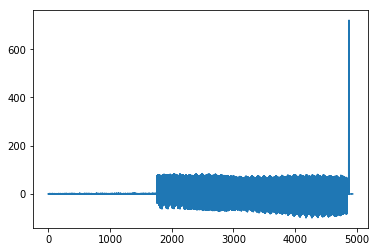

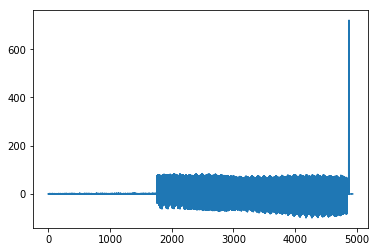

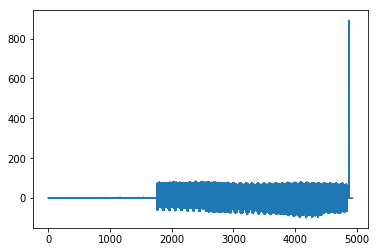

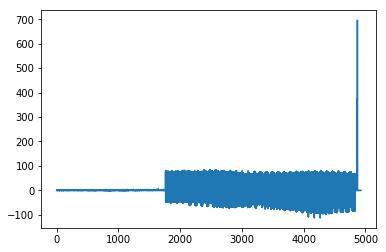

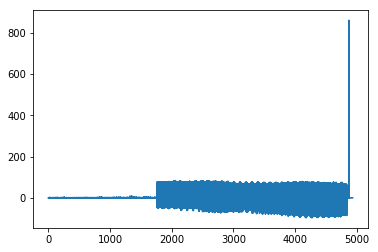

...

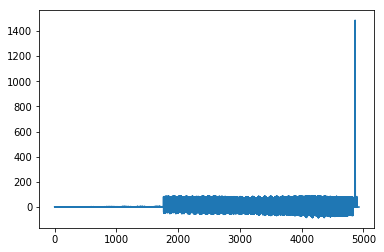

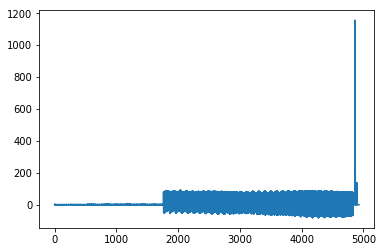

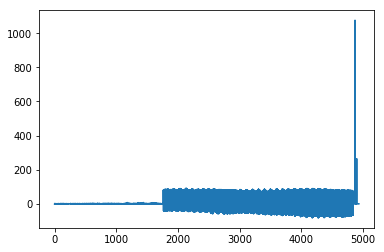

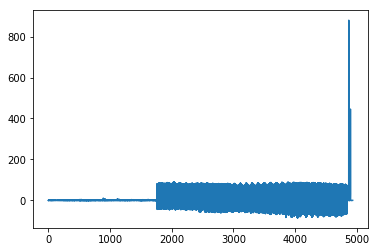

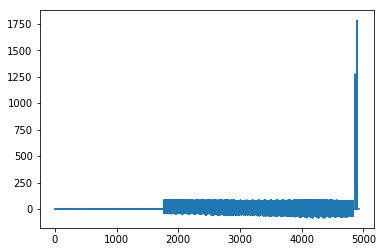

In [33]:
output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")

road_clip = clip1.fl_image(video_find_cars) #NOTE: this function expects color images!!
%time road_clip.write_videofile(output, audio=False)